## Borewell Health & Leakage Analysis (Methodology Demo)

This notebook demonstrates the analytical approach used to assess borewell health and detect inefficiencies in a utility operations environment.

- Data used is **synthetic / masked** for confidentiality
- The workflow replicates a real vendor-based smart city analytics project
- Focus is on exploratory diagnostics, abnormal pattern detection, and operational insights


### Key Business Questions

- Which borewells show abnormal or inefficient behavior?
- How do pump runtime and water output vary across borewells?
- Are there early indicators of leakage or operational issues?
- How can analytics support proactive maintenance planning?


In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings("ignore") 

In [2]:
data = pd.read_excel('TW Data.xlsx')

# Monthly Total Consumption

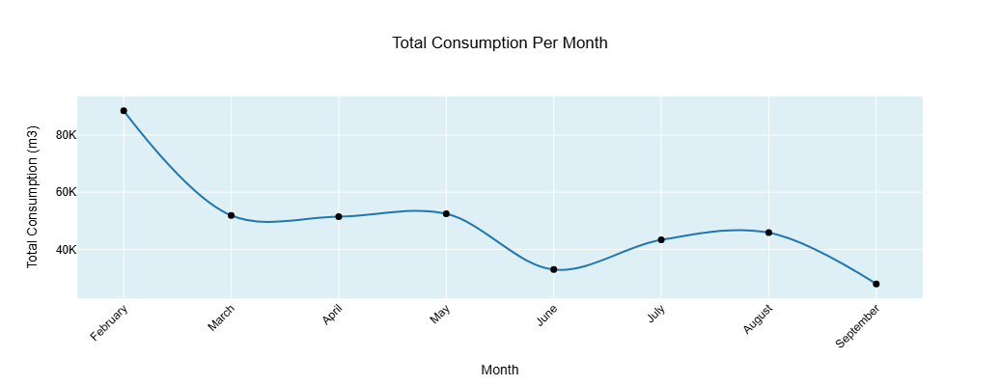

In [3]:
data['Date'] = pd.to_datetime(data['Date'])
data_filled = data.fillna(0)
data_filled['Month'] = data_filled['Date'].dt.to_period('M') 
totalizer_columns = data_filled.select_dtypes(include='number').columns
monthly_consumption = data_filled.groupby('Month')[totalizer_columns].sum().reset_index()
monthly_consumption['Total Consumption'] = monthly_consumption[totalizer_columns].sum(axis=1)
monthly_consumption['Total Consumption (Thousands)'] = monthly_consumption['Total Consumption'] / 1_000  
monthly_consumption['Month'] = monthly_consumption['Month'].dt.strftime('%B')  

fig = px.line(
    monthly_consumption, 
    x='Month', 
    y='Total Consumption (Thousands)', 
    title='Total Consumption Per Month',
    line_shape='spline',  
    color_discrete_sequence=['#1f77b4']  
)

fig.update_traces(
    line=dict(width=2),  
    mode='lines+markers',  
    marker=dict(size=7, color='black', symbol='circle'), 
    hovertemplate='%{x}<br>Total Consumption: %{y:.2f}K' 
)

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'}, 
    xaxis_title='Month',
    yaxis_title='Total Consumption (m3)',  
    height=400,  
    plot_bgcolor='rgba(173, 216, 230, 0.4)',  
    font=dict(family="Arial, sans-serif", size=12, color="Black"),
    xaxis=dict(tickangle=-45), 
)

fig.update_yaxes(tickprefix="", ticksuffix="K", showgrid=True, gridcolor='white') 
fig.show()


# Monthly Device Wise Consumption

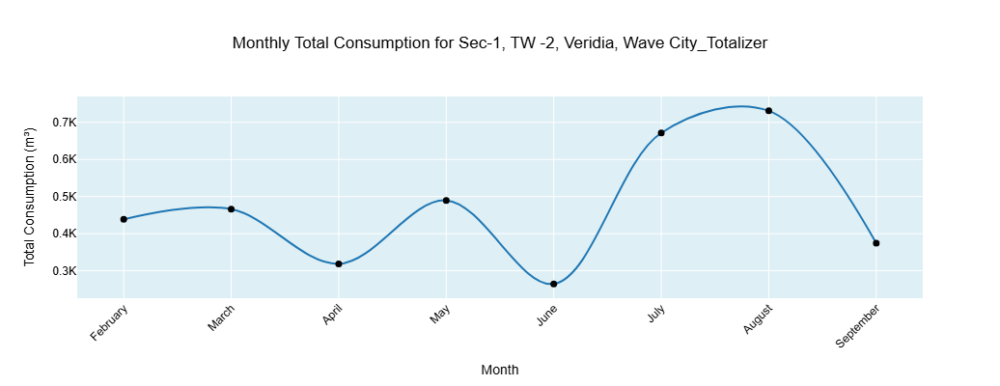

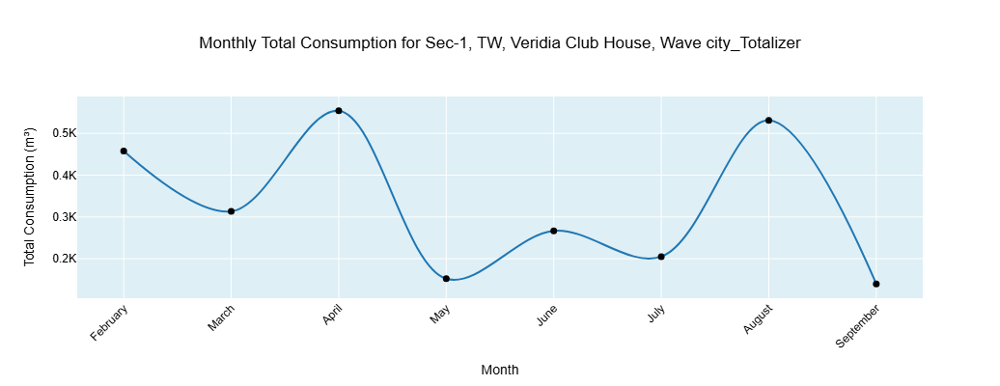

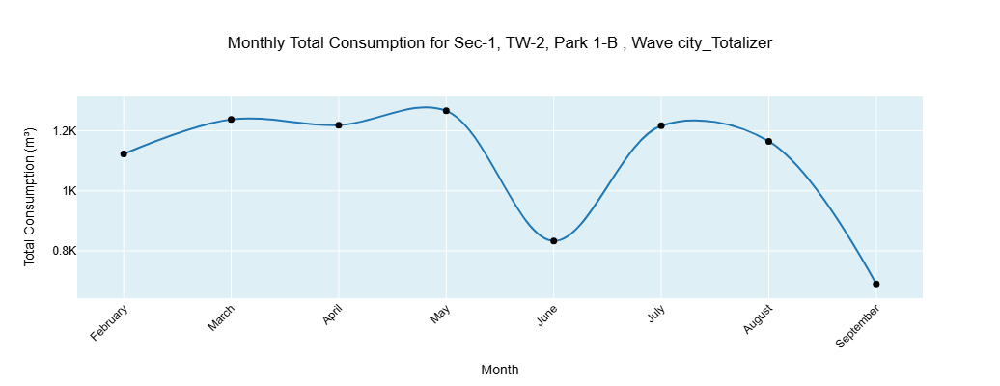

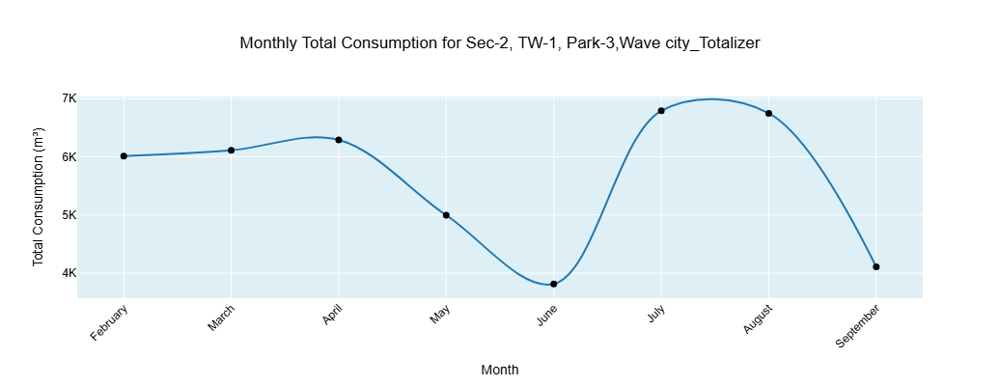

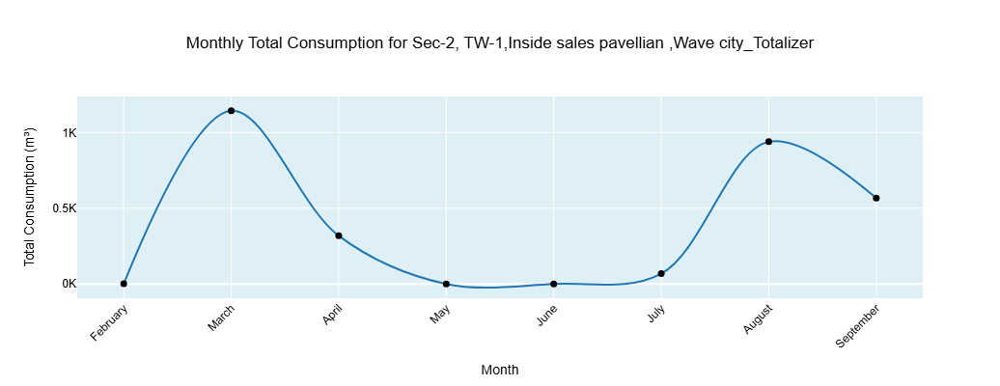

...

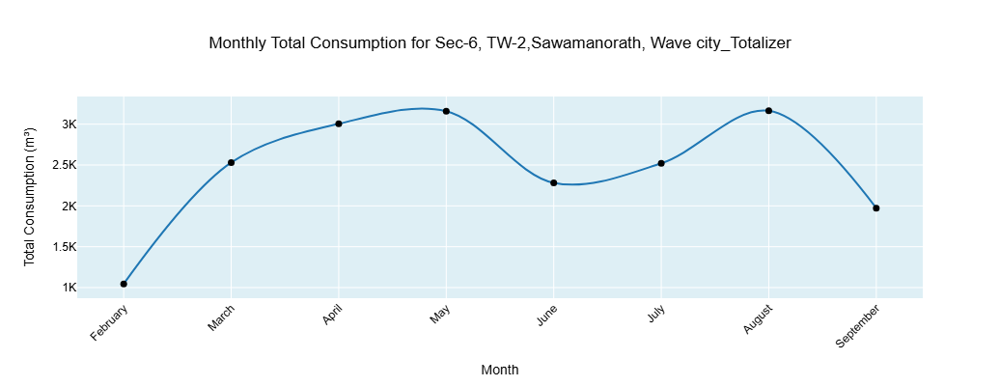

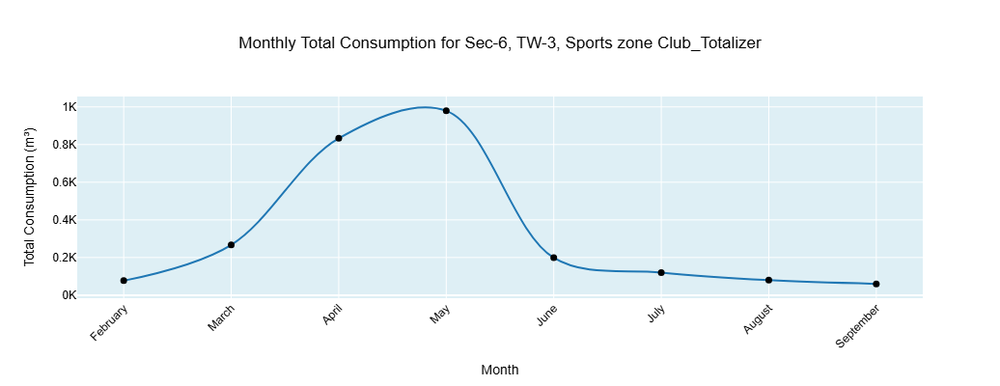

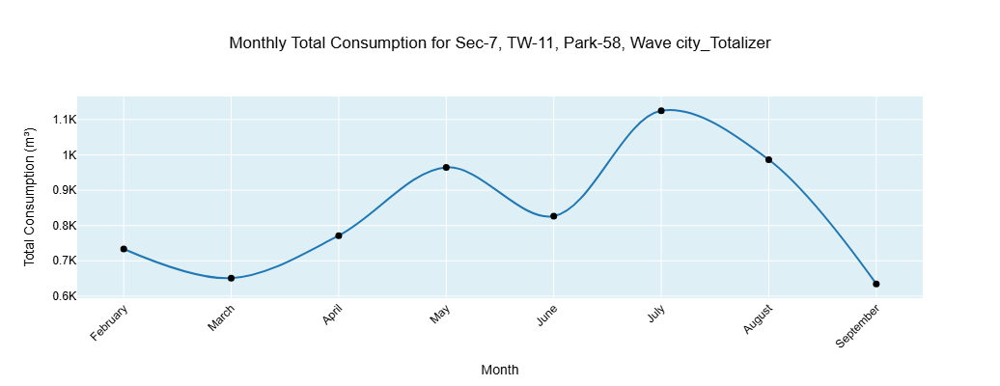

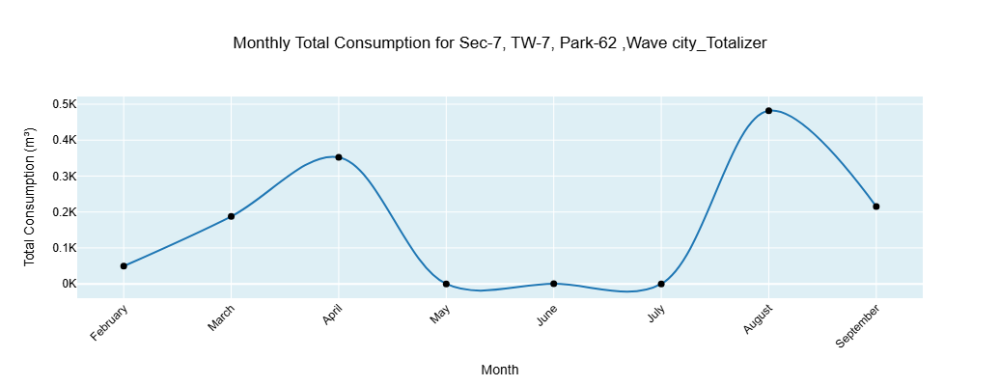

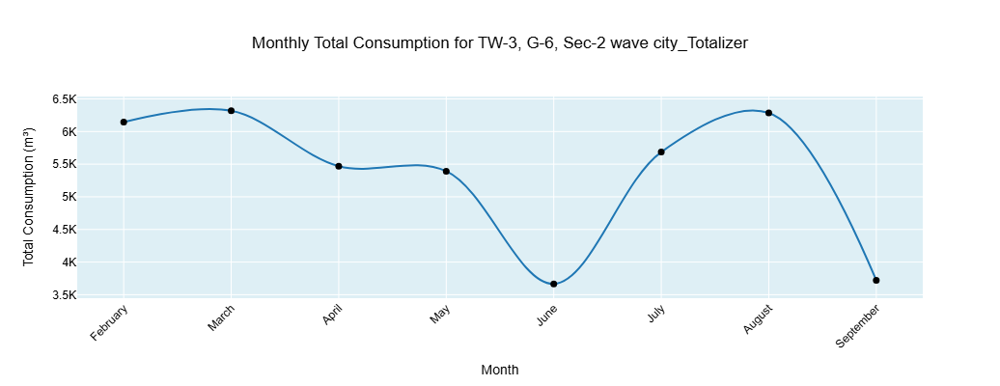

In [4]:
data['Date'] = pd.to_datetime(data['Date'])
data_filled = data.fillna(0)
data_filled['Month'] = data_filled['Date'].dt.to_period('M')  
totalizer_columns = data_filled.select_dtypes(include='number').columns
monthly_consumption_per_device = data_filled.groupby('Month')[totalizer_columns].sum().reset_index()
monthly_consumption_per_device['Month'] = monthly_consumption_per_device['Month'].dt.strftime('%B') 
monthly_consumption_per_device[totalizer_columns] = monthly_consumption_per_device[totalizer_columns] / 1_000  

for device in totalizer_columns:
    
    fig = px.line(
        monthly_consumption_per_device, 
        x='Month', 
        y=device, 
        title=f'Monthly Total Consumption for {device}',
        line_shape='spline',  
        color_discrete_sequence=['#1f77b4'] 
    )

    fig.update_traces(
        line=dict(width=2),  
        mode='lines+markers', 
        marker=dict(size=7, color='black', symbol='circle'), 
        hovertemplate='%{x}<br>Total Consumption: %{y:.2f}K'  
    )

    fig.update_layout(
        title={'x': 0.5, 'xanchor': 'center'},  
        xaxis_title='Month',
        yaxis_title='Total Consumption (m³)', 
        height=400, 
        plot_bgcolor='rgba(173, 216, 230, 0.4)',  
        font=dict(family="Arial, sans-serif", size=12, color="Black"),
        xaxis=dict(tickangle=-45),  
    )
    
    fig.update_yaxes(tickprefix="", ticksuffix="K", showgrid=True, gridcolor='white')  
    
    fig.show()


# Daily Device Wise Consumption

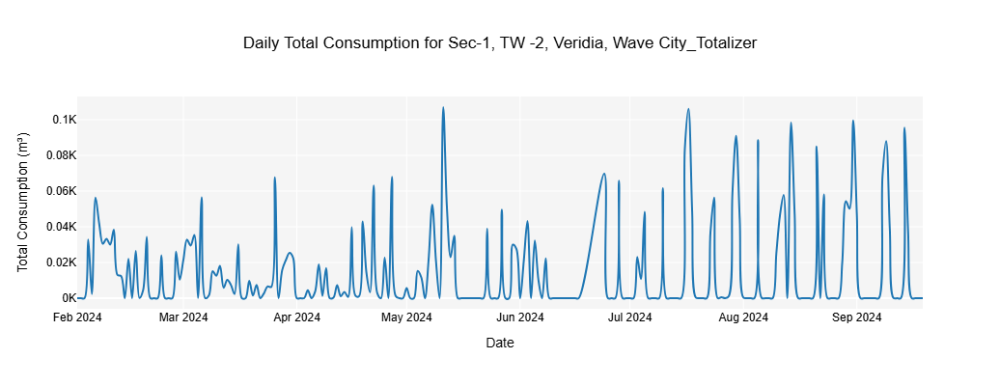

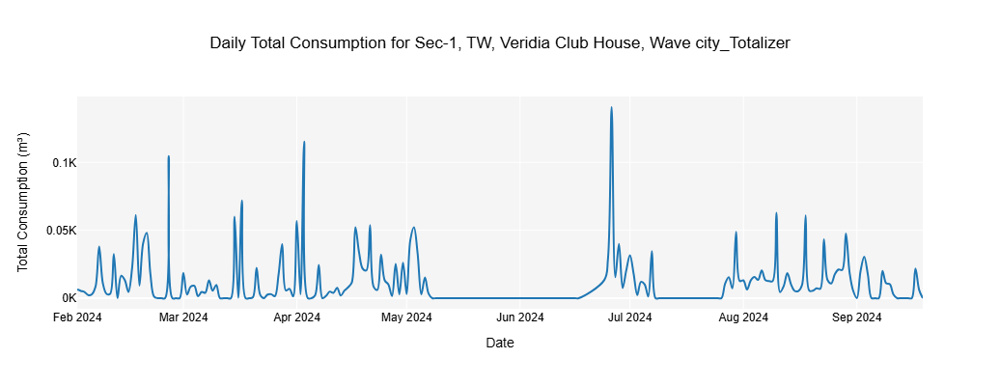

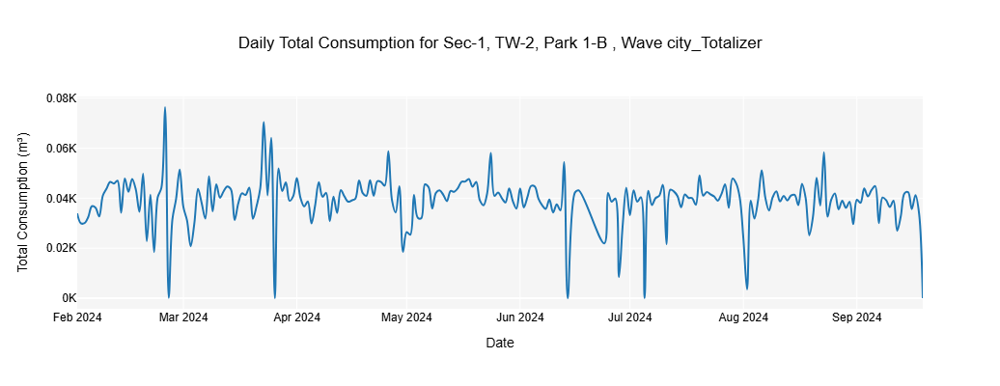

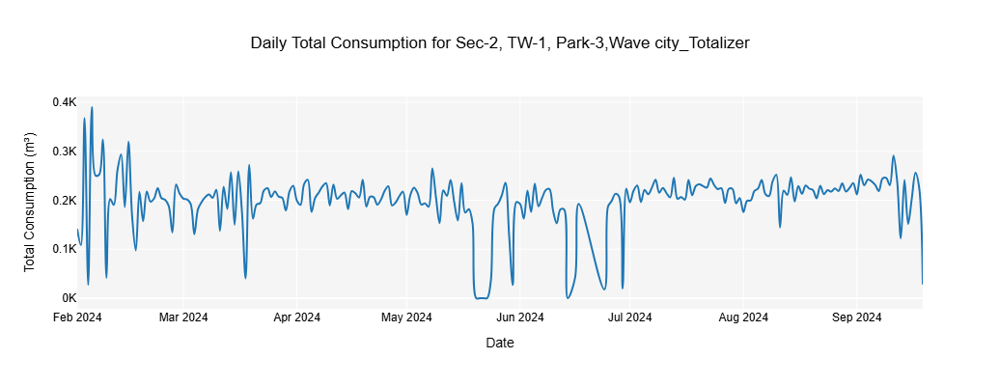

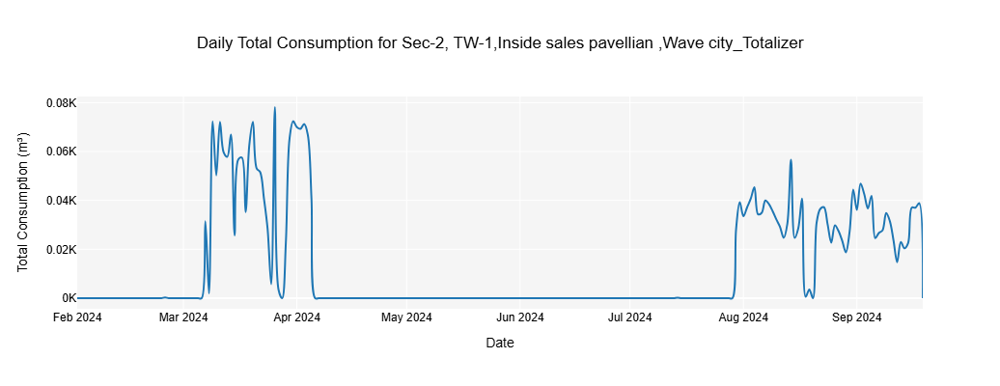

...

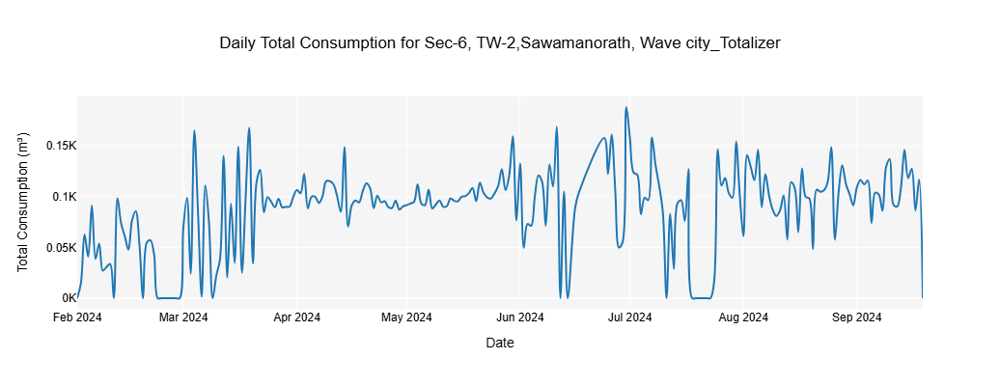

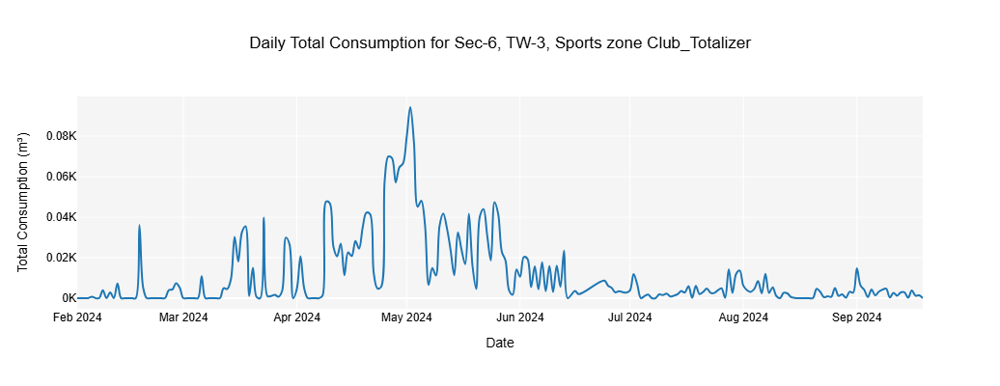

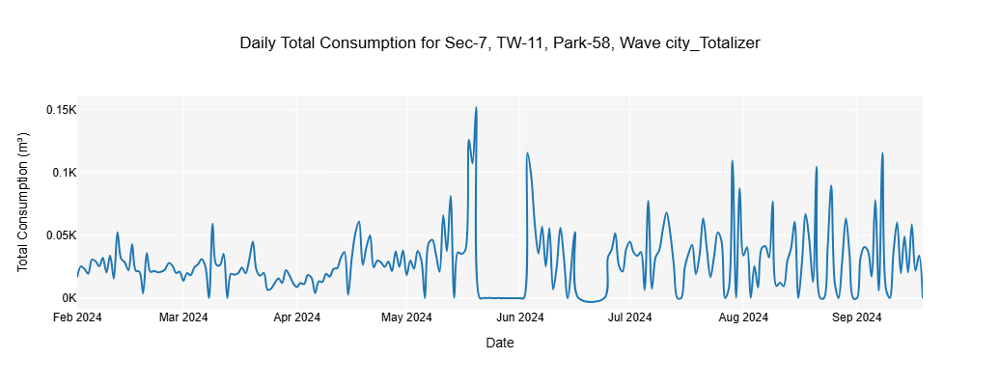

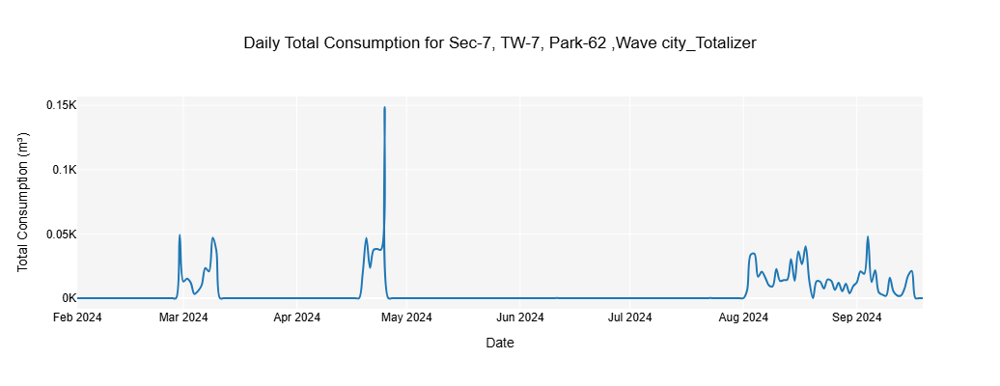

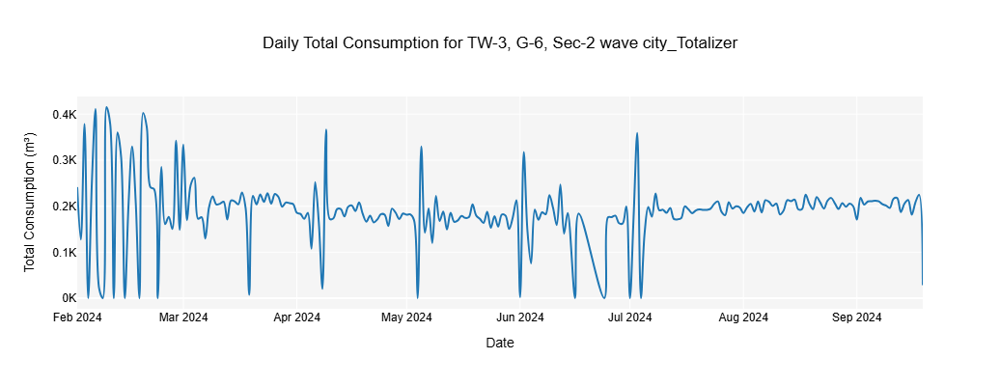

In [5]:
data_filled['Day'] = data_filled['Date'].dt.floor('D')  
totalizer_columns = data_filled.select_dtypes(include='number').columns
daily_consumption_per_device = data_filled.groupby('Day')[totalizer_columns].sum().reset_index()

# Convert consumption values to thousands
daily_consumption_per_device[totalizer_columns] = daily_consumption_per_device[totalizer_columns] / 1_000  

for device in totalizer_columns:
    
    fig = px.line(
        daily_consumption_per_device, 
        x='Day', 
        y=device, 
        title=f'Daily Total Consumption for {device}',
        line_shape='spline',  
        color_discrete_sequence=['#1f77b4']  
    )

    fig.update_traces(
        hovertemplate='%{x}<br>Total Consumption: %{y:.2f}K'  
    )

    fig.update_layout(
        title={'x': 0.5, 'xanchor': 'center'}, 
        xaxis_title='Date',
        yaxis_title='Total Consumption (m³)', 
        height=400,  
        plot_bgcolor='#f5f5f5', 
        font=dict(
            family="Arial, sans-serif",
            size=12,
            color="Black"
        )
    )

    fig.update_yaxes(tickprefix="", ticksuffix="K")  
    
    fig.show()


# Daily Total Consumption

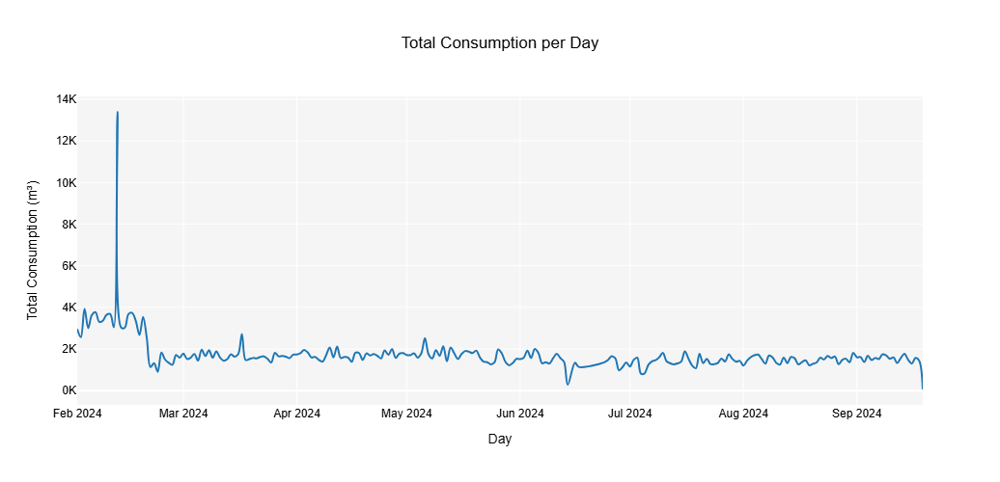

In [6]:
data['Date'] = pd.to_datetime(data['Date'])
data_filled = data.fillna(0)
totalizer_columns = data_filled.columns[1:]  
data_filled['Total Consumption'] = data_filled[totalizer_columns].sum(axis=1)
data_filled['Day'] = data_filled['Date'].dt.date
daily_consumption = data_filled.groupby('Day')['Total Consumption'].sum().reset_index()

# Convert 'Total Consumption' to thousands
daily_consumption['Total Consumption'] = daily_consumption['Total Consumption'] / 1_000  

fig = px.line(
    daily_consumption, 
    x='Day', 
    y='Total Consumption', 
    title='Total Consumption per Day',
    line_shape='spline',  
    color_discrete_sequence=['#1f77b4']  
)

fig.update_traces(
    hovertemplate='%{x}<br>Total Consumption: %{y:.2f}K'  
)

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},  
    xaxis_title='Day',
    yaxis_title='Total Consumption (m³)',  
    height=500,  
    plot_bgcolor='#f5f5f5',  
    font=dict(
        family="Arial, sans-serif",
        size=12,
        color="Black"
    )
)

fig.update_yaxes(tickprefix="", ticksuffix="K")  

fig.show()


# Device Wise Total Consumption

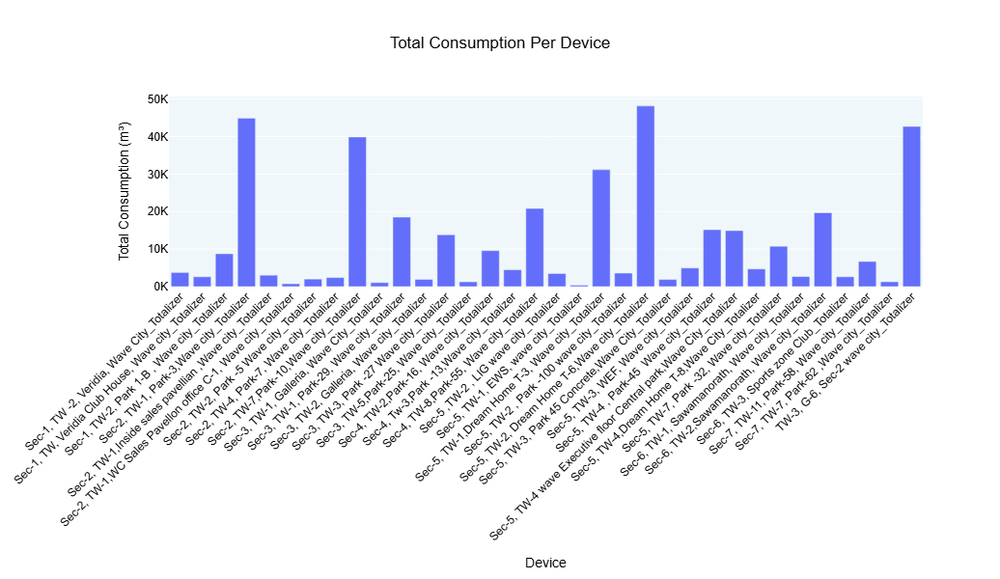

In [7]:
file_path = 'TW Data.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data_filled = data.fillna(0)
totalizer_columns = data_filled.select_dtypes(include='number').columns
total_consumption_per_device = data_filled[totalizer_columns].sum().reset_index()
total_consumption_per_device.columns = ['Device', 'Total Consumption']
total_consumption_per_device['Total Consumption (Thousands)'] = total_consumption_per_device['Total Consumption'] / 1_000 

# Create bar plot
fig = px.bar(
    total_consumption_per_device, 
    x='Device', 
    y='Total Consumption (Thousands)', 
    title='Total Consumption Per Device',
    
)

fig.update_traces(
    hovertemplate='%{x}<br>Total Consumption: %{y:.2f}K'  
)

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},  
    xaxis_title='Device',
    yaxis_title='Total Consumption (m³)',  
    height=600,
    xaxis_tickangle=-45,
    plot_bgcolor='rgba(173, 216, 230, 0.2)',  
    font=dict(family="Arial, sans-serif", size=12, color="Black")
)

fig.update_yaxes(tickprefix="", ticksuffix="K", showgrid=True, gridcolor='white')  

fig.show()


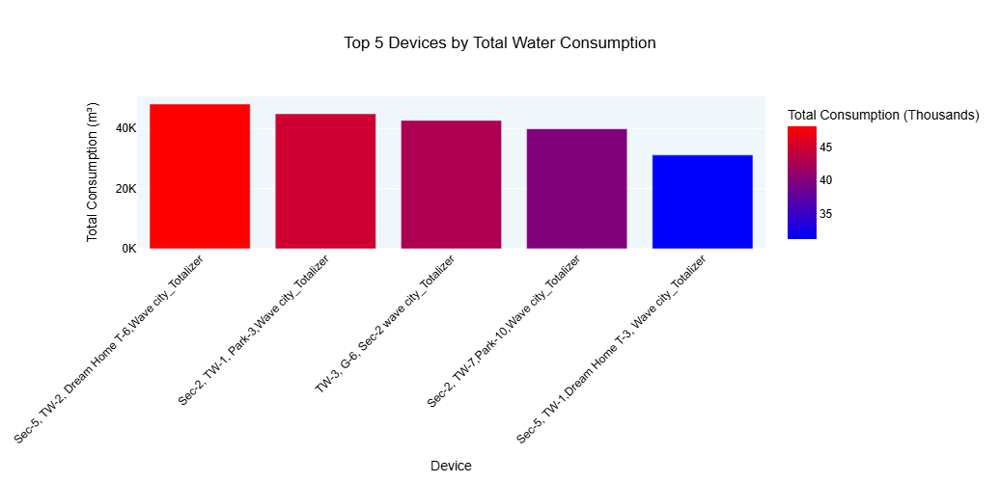

In [8]:
file_path = 'TW Data.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data_filled = data.fillna(0)
totalizer_columns = data_filled.select_dtypes(include='number').columns
total_consumption_per_device = data_filled[totalizer_columns].sum().reset_index()
total_consumption_per_device.columns = ['Device', 'Total Consumption']
total_consumption_per_device['Total Consumption (Thousands)'] = total_consumption_per_device['Total Consumption'] / 1_000 
top_5_devices = total_consumption_per_device.sort_values(by='Total Consumption', ascending=False).head(5)

fig = px.bar(
    top_5_devices, 
    x='Device', 
    y='Total Consumption (Thousands)', 
    title='Top 5 Devices by Total Water Consumption',
    color='Total Consumption (Thousands)', 
    color_continuous_scale='Bluered'  
)

fig.update_traces(
    hovertemplate='%{x}<br>Total Consumption: %{y:.2f}K'  
)

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},  
    xaxis_title='Device',
    yaxis_title='Total Consumption (m³)',  
    height=500,
    xaxis_tickangle=-45,
    plot_bgcolor='rgba(173, 216, 230, 0.2)',  
    font=dict(family="Arial, sans-serif", size=12, color="Black")
)

fig.update_yaxes(tickprefix="", ticksuffix="K", showgrid=True, gridcolor='white')  

fig.show()


# Hourly Total Consumption

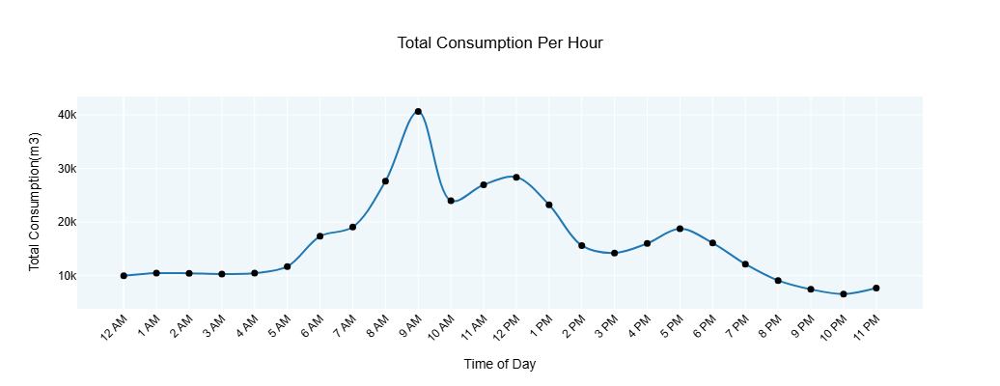

In [9]:
file_path = 'TW Data.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data = data.fillna(0)
data['Hour'] = data['Date'].dt.hour
consumption_columns = data.select_dtypes(include='number').columns.tolist()
consumption_columns.remove('Hour')
hourly_consumption = data.groupby('Hour')[consumption_columns].sum().reset_index()
hourly_consumption['Total Consumption'] = hourly_consumption[consumption_columns].sum(axis=1)

hour_labels = {i: f'{i} AM' if i < 12 else (f'{i-12} PM' if i > 12 else '12 PM') for i in range(24)}
hour_labels[0] = '12 AM'

fig = px.line(
    hourly_consumption,
    x='Hour',
    y='Total Consumption',markers=True,
    title='Total Consumption Per Hour',
    line_shape='spline',
    color_discrete_sequence=['#1f77b4']
)
fig.update_traces(
    line=dict(width=2),  
    mode='lines+markers',  
    marker=dict(size=7, color='black', symbol='circle'), 
     
)

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},
    xaxis_title='Time of Day',
    yaxis_title='Total Consumption(m3)',
    height=400,xaxis_tickangle=-45,
    plot_bgcolor='rgba(173, 216, 230, 0.2)',
    font=dict(family="Arial, sans-serif", size=12, color="Black"),
    xaxis=dict(tickmode='array', tickvals=list(hour_labels.keys()), ticktext=list(hour_labels.values()))
)
fig.show()


# Consumption by Time of Day

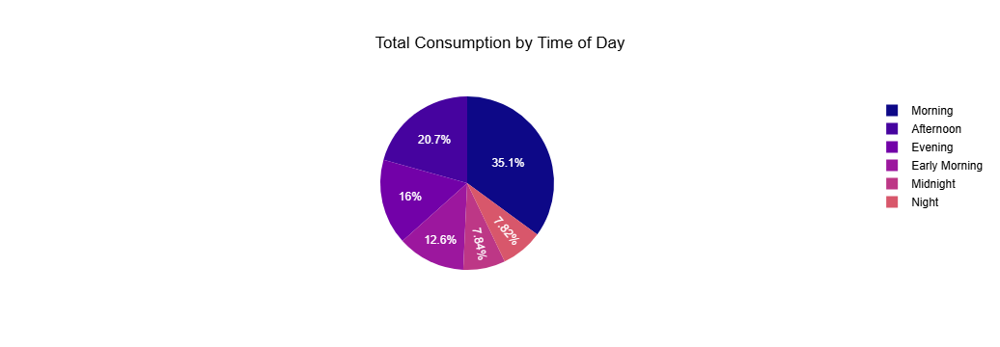

In [10]:
import pandas as pd
import plotly.express as px

file_path = 'TW Data.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data = data.fillna(0)
data['Hour'] = data['Date'].dt.hour
consumption_columns = data.select_dtypes(include='number').columns.tolist()
consumption_columns.remove('Hour')
hourly_consumption_per_device = data.groupby('Hour')[consumption_columns].sum().reset_index()

def categorize_hour(hour):
    if 0 <= hour < 3:
        return 'Midnight'
    elif 3 <= hour < 7:
        return 'Early Morning'
    elif 7 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 16:
        return 'Afternoon'
    elif 16 <= hour < 20:
        return 'Evening'
    else:
        return 'Night'

hourly_consumption_per_device['Time of Day'] = hourly_consumption_per_device['Hour'].apply(categorize_hour)
category_consumption = hourly_consumption_per_device.groupby('Time of Day')[consumption_columns].sum().reset_index()
category_consumption['Total Consumption'] = category_consumption[consumption_columns].sum(axis=1)

# Convert to thousands (K)
category_consumption['Total Consumption (Thousands)'] = category_consumption['Total Consumption'] / 1_000

fig = px.pie(
    category_consumption,
    names='Time of Day',
    values='Total Consumption (Thousands)',  
    title='Total Consumption by Time of Day',
    color_discrete_sequence=px.colors.sequential.Plasma
)

fig.update_traces(hovertemplate=
    'Time of Day: %{label}<br>' +
    'Total Consumption (Thousands): %{customdata:.2f} K m3<br>' +  
    '<extra></extra>',
    customdata=category_consumption['Total Consumption (Thousands)']
)

fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center'},
    font=dict(family="Arial, sans-serif", size=12, color="Black"),
    plot_bgcolor='rgba(173, 216, 230, 0.2)'
)

fig.show()


# Hourly Device Wise Consumption

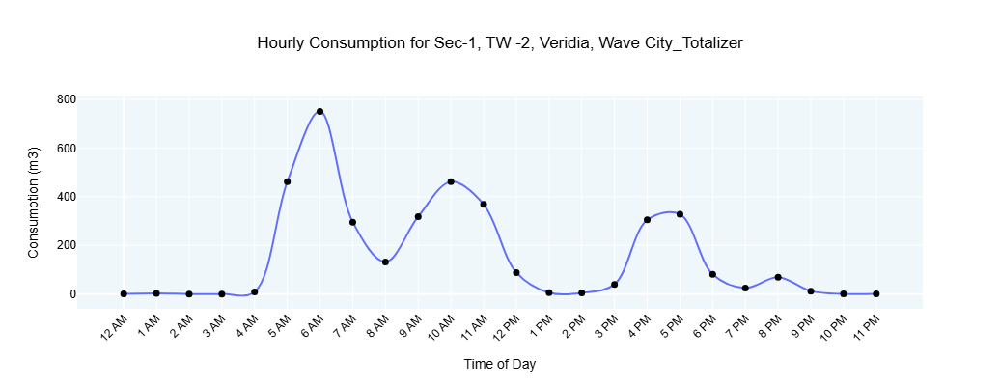

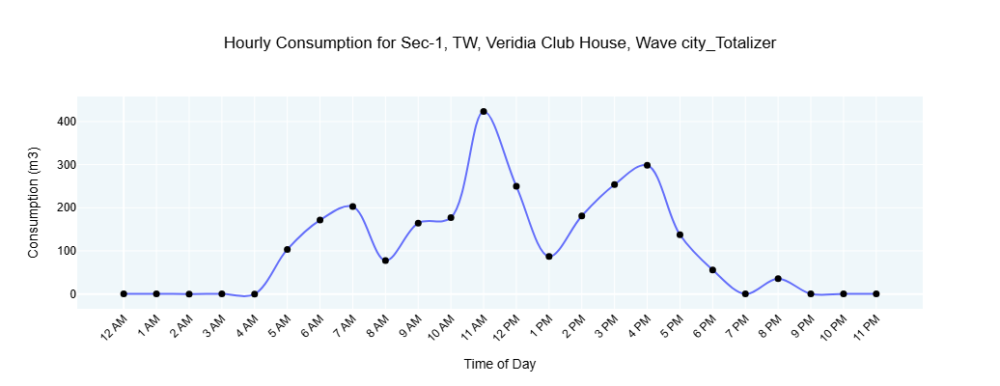

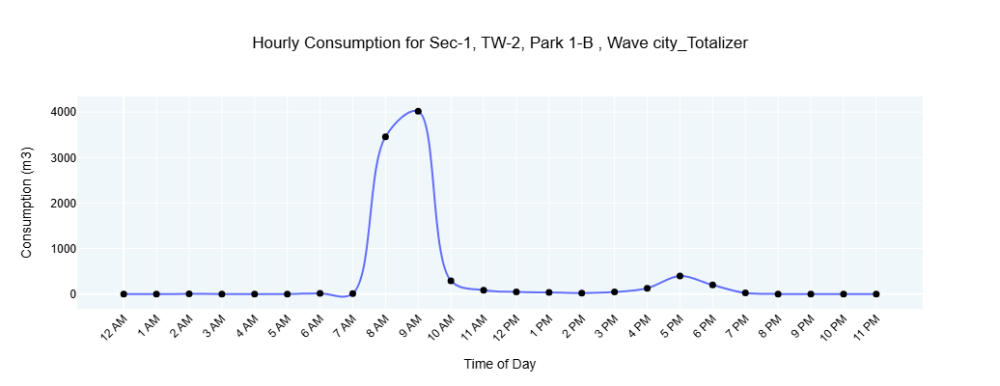

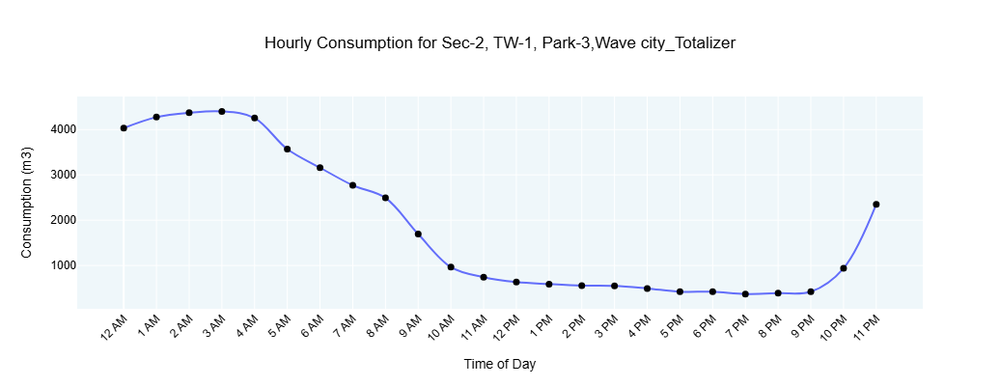

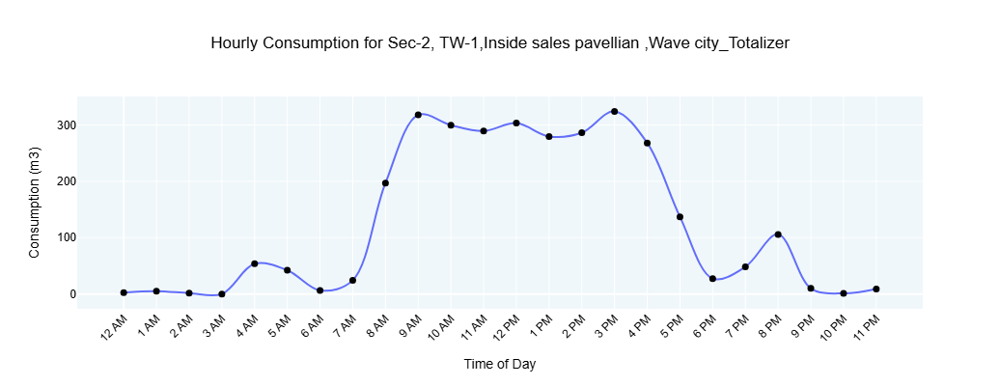

...

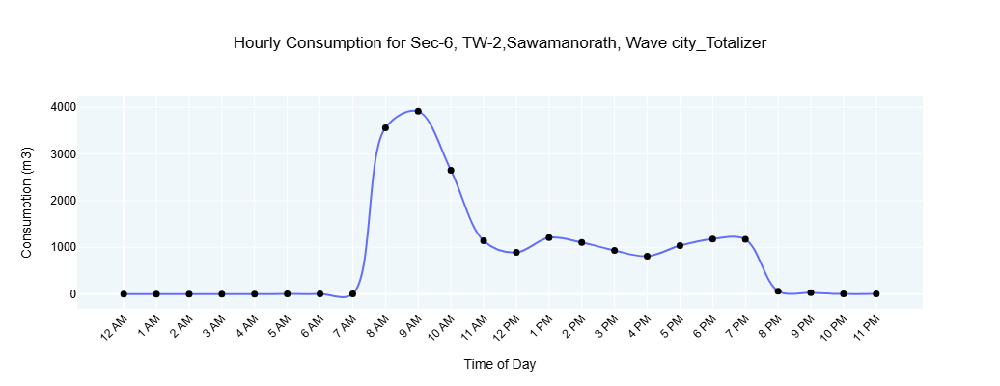

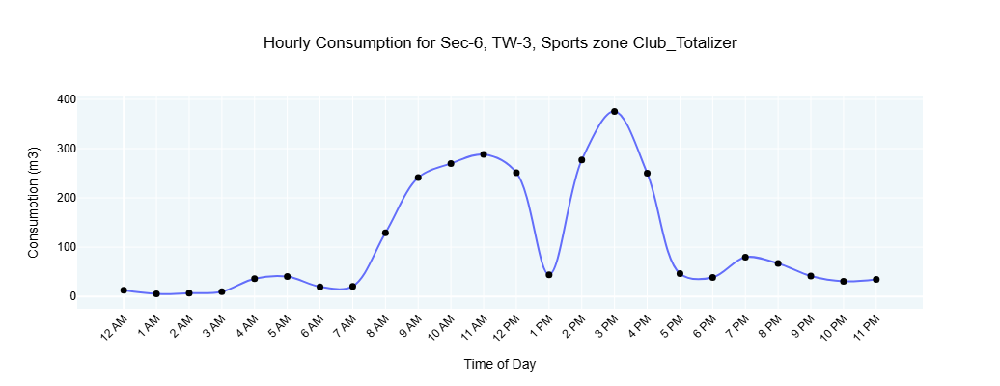

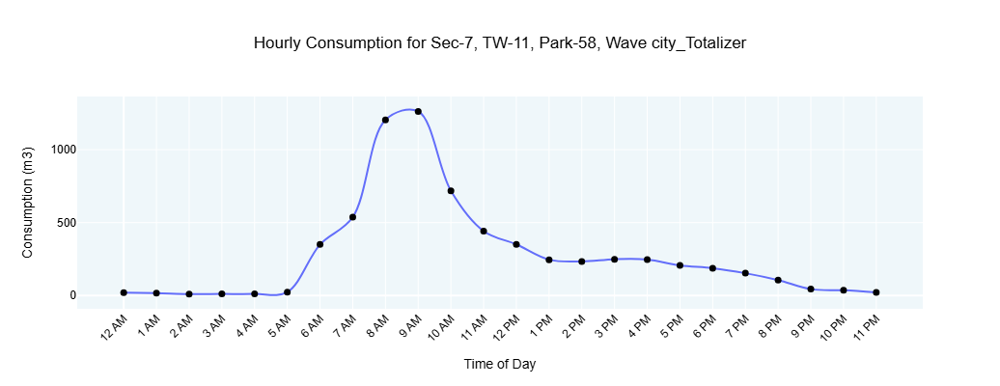

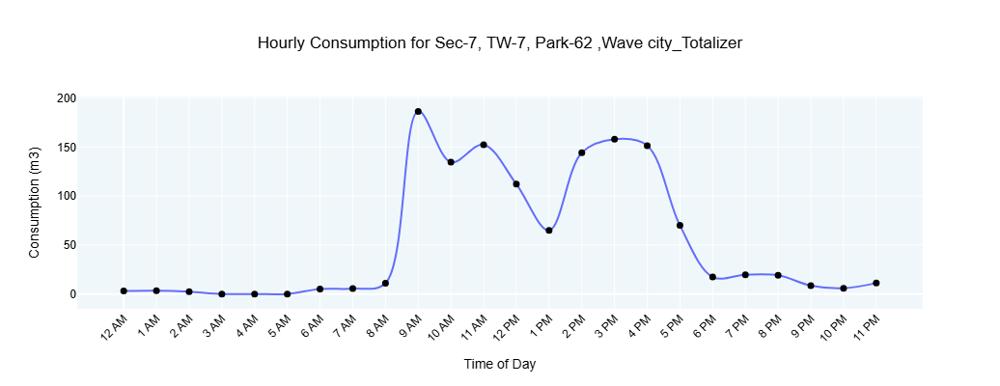

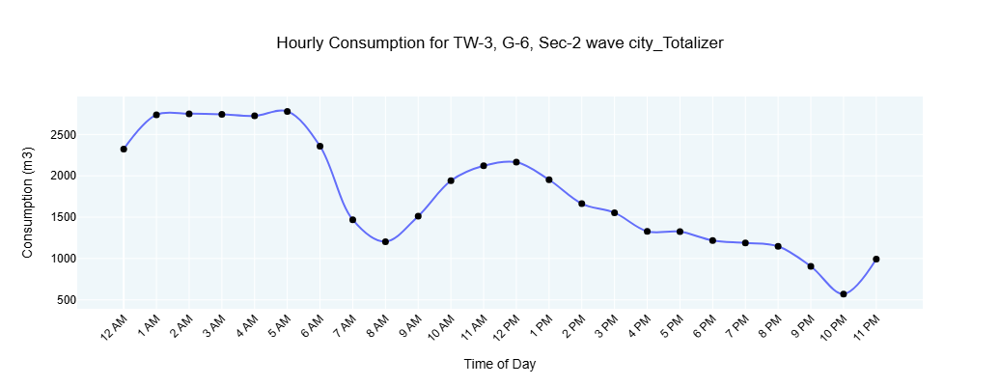

In [11]:
file_path = 'TW Data.xlsx'
data = pd.read_excel(file_path)
data['Date'] = pd.to_datetime(data['Date'])
data = data.fillna(0)
data['Hour'] = data['Date'].dt.hour

consumption_columns = data.select_dtypes(include='number').columns.tolist()
consumption_columns.remove('Hour')

hourly_consumption_per_device = data.groupby('Hour')[consumption_columns].sum().reset_index()

for device in consumption_columns:
   
    fig = px.line(
        hourly_consumption_per_device,
        x='Hour',
        y=device,
        markers=True,
        title=f'Hourly Consumption for {device}',
        line_shape='spline'
    )

    
    fig.update_traces(
        line=dict(width=2),  
        mode='lines+markers',  
        marker=dict(size=7,color='black', symbol='circle'), 
    )

    hour_labels = {i: f'{i} AM' if i < 12 else (f'{i-12} PM' if i > 12 else '12 PM') for i in range(24)}
    hour_labels[0] = '12 AM'

    fig.update_layout(
        title={'x': 0.5, 'xanchor': 'center'},
        xaxis_title='Time of Day',
        yaxis_title='Consumption (m3)',
        height=400,
        xaxis_tickangle=-45,
        plot_bgcolor='rgba(173, 216, 230, 0.2)',
        font=dict(family="Arial, sans-serif", size=12, color="Black"),
        xaxis=dict(tickmode='array', tickvals=list(hour_labels.keys()), ticktext=list(hour_labels.values()))
    )
    
    fig.show()


# Sector Wise Total Consumption

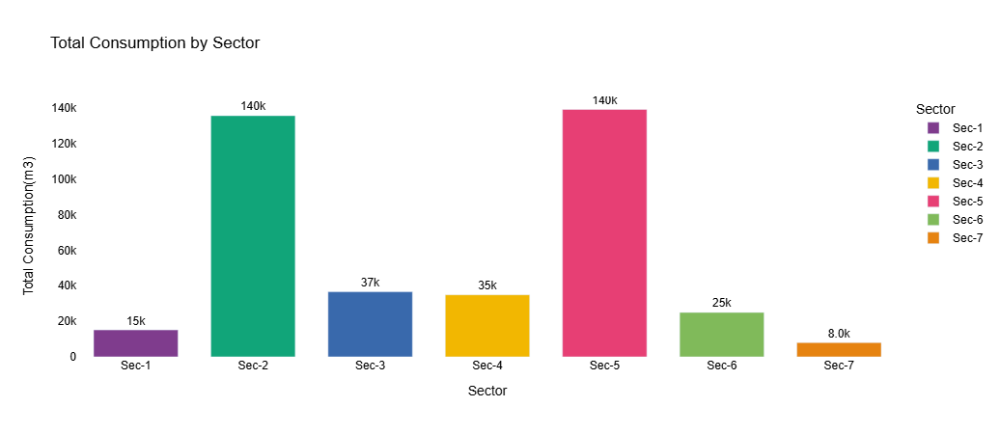

In [12]:
file_path = 'TW Data.xlsx'
data = pd.read_excel(file_path)
data_filled = data.fillna(0)

sector_consumption = {
    'Sec-1': data.filter(like='Sec-1').sum().sum(),
    'Sec-2': data.filter(like='Sec-2').sum().sum(),
    'Sec-3': data.filter(like='Sec-3').sum().sum(),
    'Sec-4': data.filter(like='Sec-4').sum().sum(),
    'Sec-5': data.filter(like='Sec-5').sum().sum(),
    'Sec-6': data.filter(like='Sec-6').sum().sum(),
    'Sec-7': data.filter(like='Sec-7').sum().sum(),
}
sector_consumption_df = pd.DataFrame(list(sector_consumption.items()), columns=['Sector', 'Total Consumption'])

fig = px.bar(
    sector_consumption_df,
    x='Sector',
    y='Total Consumption',
    title='Total Consumption by Sector',
    color='Sector',  
    text='Total Consumption',
    height=450,
    color_discrete_sequence=px.colors.qualitative.Bold,  
)

fig.update_layout(
    xaxis_title='Sector',
    yaxis_title='Total Consumption(m3)',
    plot_bgcolor='rgba(0, 0, 0, 0)', 
    bargap=0.2, 
    bargroupgap=0.1, 
    font=dict(family="Arial, sans-serif", size=12, color="Black"),
)

fig.update_traces(    
    texttemplate='%{text:.2s}', 
    textposition='outside',  
    hoverinfo='x+y', 
)
fig.show()


### Key Insights & Business Impact

**Key Insights**
- Exploratory analysis identified a subset of borewells with inefficient performance patterns.
- Abnormal trends in pump runtime and output highlighted potential leakage or mechanical issues.
- Comparative analysis enabled prioritization of high-risk borewells.

**Business Impact (Real-World Context)**
- Enabled early detection of inefficient borewells (~22% identified).
- Supported proactive maintenance planning.
- Contributed to ~26% reduction in average borewell downtime and improved water availability in high-demand zones.
